In [ ]:
!pip install Kaggle
!pip install -U dataprep
!pip install pycaret[full]

!pip install jinja2==3.1.2

  Using cached Jinja2-3.0.3-py3-none-any.whl.metadata (3.5 kB)
  Using cached pandas-1.5.3-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  Using cached pydantic-1.10.19-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (152 kB)
  Using cached SQLAlchemy-1.3.24-cp310-cp310-linux_x86_64.whl
INFO: pip is looking at multiple versions of dask[array,dataframe,delayed] to determine which version is compatible with other requirements. This could take a while.
  Using cached dask-2024.12.0-py3-none-any.whl.metadata (3.7 kB)
  Using cached dask-2024.11.2-py3-none-any.whl.metadata (3.7 kB)
  Using cached dask-2024.11.1-py3-none-any.whl.metadata (3.7 kB)
  Using cached dask-2024.10.0-py3-none-any.whl.metadata (3.7 kB)
  Using cached dask-2024.9.1-py3-none-any.whl.metadata (3.7 kB)
  Using cached dask-2024.9.0-py3-none-any.whl.metadata (3.7 kB)
  Using cached dask-2024.8.2-py3-none-any.whl.metadata (3.7 kB)
INFO: pip is still looking at multiple versi

In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from dataprep.eda import *
from pycaret.classification import *
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns



In [ ]:
from google.colab import files
uploaded = files.upload()

Saving aw_fb_data.csv to aw_fb_data.csv


In [ ]:
df=pd.read_csv('aw_fb_data.csv')

In [ ]:
df.head()

,Unnamed: 0,X1,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,device,activity
0,1,1,20,1,168.0,65.4,10.771429,78.531302,0.344533,0.008327,6.221612,6.116349,59.0,1.000000,19.531302,0.138520,1.000000,0.089692,apple watch,Lying
1,2,2,20,1,168.0,65.4,11.475325,78.453390,3.287625,0.008896,6.221612,6.116349,59.0,1.000000,19.453390,0.137967,1.000000,0.102088,apple watch,Lying
2,3,3,20,1,168.0,65.4,12.179221,78.540825,9.484000,0.009466,6.221612,6.116349,59.0,1.000000,19.540825,0.138587,1.000000,0.115287,apple watch,Lying
3,4,4,20,1,168.0,65.4,12.883117,78.628260,10.154556,0.010035,6.221612,6.116349,59.0,1.000000,19.628260,0.139208,1.000000,0.129286,apple watch,Lying
4,5,5,20,1,168.0,65.4,13.587013,78.715695,10.825111,0.010605,6.221612,6.116349,59.0,0.982816,19.715695,0.139828,0.241567,0.144088,apple watch,Lying


In [ ]:
df=df.drop(['Unnamed: 0','X1'],axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6264 entries, 0 to 6263
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   age                   6264 non-null   int64  
 1   gender                6264 non-null   int64  
 2   height                6264 non-null   float64
 3   weight                6264 non-null   float64
 4   steps                 6264 non-null   float64
 5   hear_rate             6264 non-null   float64
 6   calories              6264 non-null   float64
 7   distance              6264 non-null   float64
 8   entropy_heart         6264 non-null   float64
 9   entropy_setps         6264 non-null   float64
 10  resting_heart         6264 non-null   float64
 11  corr_heart_steps      6264 non-null   float64
 12  norm_heart            6264 non-null   float64
 13  intensity_karvonen    6264 non-null   float64
 14  sd_norm_heart         6264 non-null   float64
 15  steps_times_distance 

In [ ]:
df_aw=df[df['device']=='apple watch']

In [ ]:
df_fb=df[df['device']=='fitbit']

In [ ]:
df_aw=df_aw.drop('device',axis=1)

In [ ]:
df_fb=df_fb.drop('device',axis=1)

In [ ]:
df_fb['activity'].value_counts()

,count
activity,
Lying,592
Running 7 METs,501
Running 5 METs,399
Running 3 METs,378
Sitting,378
Self Pace walk,360


In [ ]:
labels = ['Lying','Running 7 METs','Running 5 METs','Running 3 METs', 'Sitting', 'Self Pace walk'] # καθορισμός ετικετών

In [ ]:
values = df_aw['activity'].value_counts() # μετρήσεις των δραστηριοτήτων στο DataFrame 'df_aw'

In [ ]:
colors = ['red', 'royalblue','green','yellow','pink','grey'] # καθορισμός χρωμάτων

In [ ]:
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5)]) # δημιουργία διαγράμματος πίτας με Plotly

In [ ]:
fig.update_traces(hoverinfo='label+value',textfont_size=15,marker=dict(colors=colors)) #ρυθμίσεις στοιχείων διαγράμματος

In [ ]:
fig.update_layout(annotations=[dict(text='AW 6 types of Activity', x=0.50, y=0.5, font_size=15, showarrow=False)]) # ρυθμίσεις ετικετών

In [ ]:
fig.show() # εμφάνιση διαγράμματος

<Axes: >

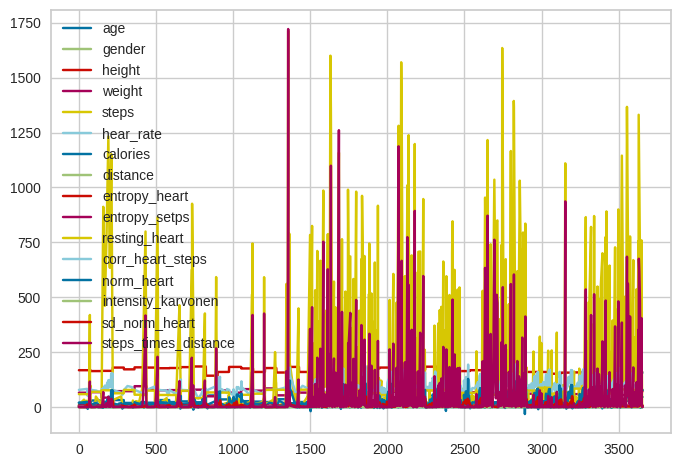

In [ ]:
df_aw.plot()

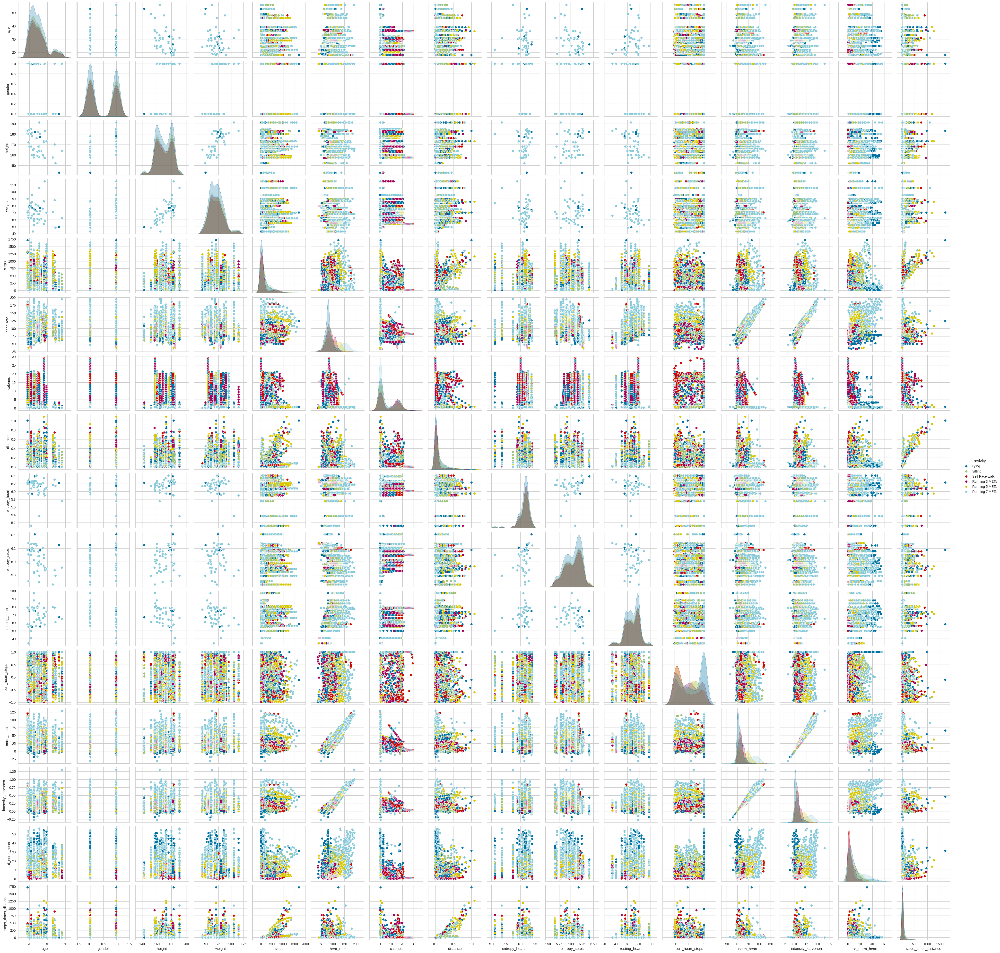

In [ ]:
sns.pairplot(df_aw,hue='activity')

In [ ]:
df_train, df_test = train_test_split(df_aw, random_state =100 ,test_size = 0.3)

In [ ]:
setup_df = setup( data= df_train, target = 'activity',session_id=100, data_split_stratify=True, remove_outliers=True)

,Description,Value
0,Session id,100
1,Target,activity
2,Target type,Multiclass
3,Target mapping,"Lying: 0, Running 3 METs: 1, Running 5 METs: 2, Running 7 METs: 3, Self Pace walk: 4, Sitting: 5"
4,Original data shape,"(2559, 17)"
5,Transformed data shape,"(2469, 17)"
6,Transformed train set shape,"(1701, 17)"
7,Transformed test set shape,"(768, 17)"
8,Numeric features,16
9,Preprocess,True


In [ ]:
lgbm = create_model("lightgbm")

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,19:23:14
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Light Gradient Boosting Machine


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

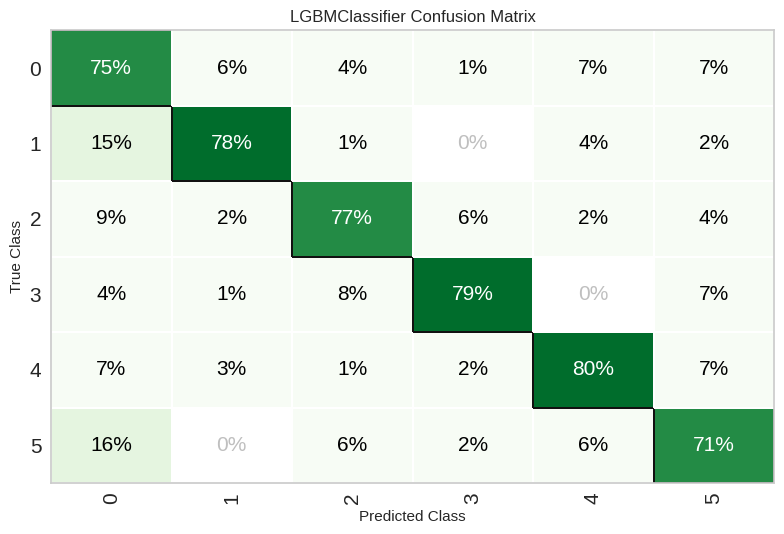

In [34]:
plot_model(estimator = lgbm, plot= "confusion_matrix",plot_kwargs = {'percent' : True})

In [35]:
predict_model(lgbm)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.7656,0.9499,0.7656,0.7719,0.7675,0.7174,0.7180


,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,activity,prediction_label,prediction_score
2585,31,0,168.0,68.000000,5.291667,109.875000,0.250833,0.004379,6.169925,5.692059,64.866669,0.328228,45.008335,0.362581,4.263043,0.023173,Running 5 METs,Running 5 METs,0.9974
823,22,1,185.0,79.400002,44.885715,81.765648,1.664995,0.034183,6.234120,6.259761,40.636364,1.000000,41.129288,0.261365,15.206517,1.534348,Running 7 METs,Running 7 METs,0.9374
1288,36,0,157.5,53.599998,9.750376,79.563560,12.447993,0.006497,6.008680,6.103885,78.823448,-1.000000,0.740113,0.007037,0.560201,0.063348,Sitting,Sitting,0.9179
2060,39,0,173.0,70.000000,105.000000,97.500000,12.349600,0.080080,6.095485,5.888689,73.666664,-0.021546,23.833334,0.222050,11.772850,8.408400,Running 3 METs,Running 3 METs,0.9852
3496,36,0,172.0,86.400002,601.666687,112.990738,0.556500,0.365018,6.339850,6.055658,78.531303,-0.427658,34.459438,0.326727,25.447674,219.619370,Sitting,Sitting,0.9876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2869,25,0,160.0,57.700001,76.000000,94.428574,0.713000,0.004560,6.142147,6.020552,78.531303,0.045601,15.897269,0.136494,5.349730,0.346560,Lying,Self Pace walk,0.8509
428,23,1,181.0,95.199997,663.404785,58.666668,18.455544,0.434539,6.259761,6.259761,56.333332,0.895876,2.333333,0.016588,2.342137,288.275482,Running 7 METs,Sitting,0.6039
572,32,1,177.0,76.699997,10.000000,66.000000,15.399200,0.004800,6.142147,6.169925,55.285713,0.840891,10.714286,0.080732,7.691932,0.048000,Sitting,Sitting,0.9427
2114,22,1,180.0,83.599998,596.000000,63.846153,20.611000,0.342150,5.118769,6.101345,50.000000,-0.111321,13.846154,0.093555,1.032771,203.921402,Self Pace walk,Self Pace walk,0.5120


In [36]:
pred = predict_model(lgbm, data=df_test)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.7484,0.9406,0.7484,0.7529,0.7498,0.6958,0.6961


In [37]:
pred.head()

,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,activity,prediction_label,prediction_score
2488,56,1,164.0,62.000000,57.131313,65.000000,0.287333,0.032524,5.745907,5.909441,65.000000,-0.384876,0.000000,0.000000,1.615055,1.858127,Lying,Lying,0.7518
423,23,1,181.0,95.199997,493.285706,54.777779,19.721733,0.325575,6.259761,6.259761,56.333332,-0.085329,-1.555556,-0.011058,1.923440,160.601425,Sitting,Sitting,0.9948
1311,36,0,157.5,53.599998,12.551724,83.819206,24.278137,0.006387,6.008680,6.103885,78.823448,1.000000,4.995762,0.047499,0.560201,0.080167,Running 3 METs,Lying,0.7003
2416,30,1,182.0,80.000000,177.000000,72.000000,9.676800,0.115690,5.913763,5.941932,69.599998,0.198053,2.400000,0.019934,9.399911,20.477131,Lying,Lying,0.9876
2862,25,0,160.0,57.700001,857.750000,109.333336,0.756000,0.030995,6.142147,6.020552,78.531303,0.528794,30.802031,0.264466,4.203851,26.585960,Running 3 METs,Running 3 METs,0.9943


In [38]:
rf = create_model("rf")

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7444,0.9251,0.7444,0.7488,0.7404,0.6933,0.6959
1,0.7374,0.9496,0.7374,0.7391,0.7364,0.6840,0.6847
2,0.7318,0.9319,0.7318,0.7384,0.7334,0.6775,0.6781
3,0.8045,0.9309,0.8045,0.8056,0.8023,0.7647,0.7658
4,0.7933,0.9628,0.7933,0.8070,0.7944,0.7505,0.7530
5,0.7765,0.9463,0.7765,0.7759,0.7757,0.7311,0.7313
6,0.7933,0.9633,0.7933,0.8035,0.7920,0.7508,0.7531
7,0.7933,0.9585,0.7933,0.7929,0.7920,0.7511,0.7515
8,0.7095,0.9332,0.7095,0.7065,0.7022,0.6493,0.6519


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

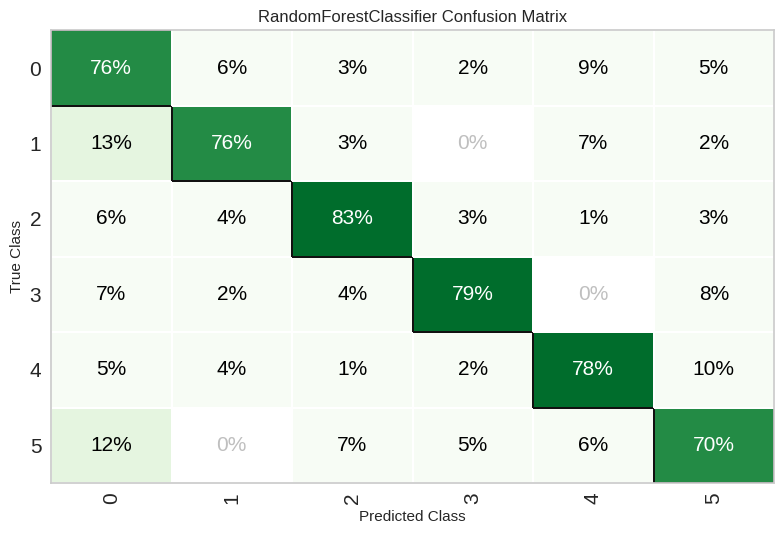

In [39]:
plot_model(estimator=rf, plot="confusion_matrix", plot_kwargs={'percent': True})

In [40]:
predict_model(rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7695,0.9494,0.7695,0.7730,0.7704,0.7223,0.7226


,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,activity,prediction_label,prediction_score
2585,31,0,168.0,68.000000,5.291667,109.875000,0.250833,0.004379,6.169925,5.692059,64.866669,0.328228,45.008335,0.362581,4.263043,0.023173,Running 5 METs,Running 5 METs,0.77
823,22,1,185.0,79.400002,44.885715,81.765648,1.664995,0.034183,6.234120,6.259761,40.636364,1.000000,41.129288,0.261365,15.206517,1.534348,Running 7 METs,Running 7 METs,0.51
1288,36,0,157.5,53.599998,9.750376,79.563560,12.447993,0.006497,6.008680,6.103885,78.823448,-1.000000,0.740113,0.007037,0.560201,0.063348,Sitting,Sitting,0.66
2060,39,0,173.0,70.000000,105.000000,97.500000,12.349600,0.080080,6.095485,5.888689,73.666664,-0.021546,23.833334,0.222050,11.772850,8.408400,Running 3 METs,Running 3 METs,0.51
3496,36,0,172.0,86.400002,601.666687,112.990738,0.556500,0.365018,6.339850,6.055658,78.531303,-0.427658,34.459438,0.326727,25.447674,219.619370,Sitting,Sitting,0.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2869,25,0,160.0,57.700001,76.000000,94.428574,0.713000,0.004560,6.142147,6.020552,78.531303,0.045601,15.897269,0.136494,5.349730,0.346560,Lying,Self Pace walk,0.49
428,23,1,181.0,95.199997,663.404785,58.666668,18.455544,0.434539,6.259761,6.259761,56.333332,0.895876,2.333333,0.016588,2.342137,288.275482,Running 7 METs,Sitting,0.65
572,32,1,177.0,76.699997,10.000000,66.000000,15.399200,0.004800,6.142147,6.169925,55.285713,0.840891,10.714286,0.080732,7.691932,0.048000,Sitting,Sitting,0.50
2114,22,1,180.0,83.599998,596.000000,63.846153,20.611000,0.342150,5.118769,6.101345,50.000000,-0.111321,13.846154,0.093555,1.032771,203.921402,Self Pace walk,Sitting,0.77


In [41]:
pred = predict_model(rf, data=df_test)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7484,0.9482,0.7484,0.7504,0.7492,0.6960,0.6961


In [42]:
pred.head()

,age,gender,height,weight,steps,hear_rate,calories,distance,entropy_heart,entropy_setps,resting_heart,corr_heart_steps,norm_heart,intensity_karvonen,sd_norm_heart,steps_times_distance,activity,prediction_label,prediction_score
2488,56,1,164.0,62.000000,57.131313,65.000000,0.287333,0.032524,5.745907,5.909441,65.000000,-0.384876,0.000000,0.000000,1.615055,1.858127,Lying,Lying,0.38
423,23,1,181.0,95.199997,493.285706,54.777779,19.721733,0.325575,6.259761,6.259761,56.333332,-0.085329,-1.555556,-0.011058,1.923440,160.601425,Sitting,Sitting,0.89
1311,36,0,157.5,53.599998,12.551724,83.819206,24.278137,0.006387,6.008680,6.103885,78.823448,1.000000,4.995762,0.047499,0.560201,0.080167,Running 3 METs,Running 3 METs,0.54
2416,30,1,182.0,80.000000,177.000000,72.000000,9.676800,0.115690,5.913763,5.941932,69.599998,0.198053,2.400000,0.019934,9.399911,20.477131,Lying,Lying,0.78
2862,25,0,160.0,57.700001,857.750000,109.333336,0.756000,0.030995,6.142147,6.020552,78.531303,0.528794,30.802031,0.264466,4.203851,26.585960,Running 3 METs,Running 3 METs,0.87


In [43]:
#Στην συγκεκριμένη εργασία, και οι δύο αλγόριθμοι έχουν σε μεγάλο βαθμό ακριβώς ίδια αποτελέσματα όσο αφορά τα νούμερα των metrics.
#Ωστόσο, ο RandomForest είναι οριακά καλύτερος εάν κρίνουμε από:
#AUC (rf...0.9482) ενώ (lgbm...0.9406).
#Επίσης, Kappa (rf...0.6960) ενώ (lgbm...0.6958).
#Τελικά, με βάση τα αποτελέσματα ο Random Forest είναι το καλύτερο μοντέλο, αν και με πολύ μικρή διαφορά.